<a href="https://colab.research.google.com/github/Leanse1/Harry-Potter-Characters-Recognition/blob/main/HARRY_POTTER_CHARACTER_PREDICTION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **A comparision between Image classification and Image detection and Face Recognition**

## **1. Image Classification**

I downloaded the Harry Potter character images from Google and added it on google drive








In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
%cd /content/gdrive/MyDrive/Datasets/Harry Potter


/content/gdrive/MyDrive/Datasets/Harry Potter


In [ ]:
!ls

'ALBUS DUMBLEDORE'      DOBBY	       'GINNY WEASLEY'	'HERMIONE GRANGER'  'LUNA LOVEGOOD'
'BELLATRIX LESTRANGE'  'DRACO MALFOY'  'HARRY POTTER'	'LORD VOLDEMORT'    'MINERVA MCGONAGALL'


In [3]:
import tensorflow as tf
from tensorflow.keras import models,layers
import matplotlib.pyplot as plt

In [ ]:
BATCH_SIZE = 32
IMAGE_SIZE = 224
CHANNELS=3
EPOCHS=50

In [ ]:
dataset = '/content/gdrive/MyDrive/Harry Potter'

# Create a dataset from the directory
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    dataset,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 1071 files belonging to 18 classes.


In [ ]:
class_names = dataset.class_names
class_names

['ALBUS DUMBLEDORE',
 'BELLATRIX LESTRANGE',
 'CHO CHANG',
 'DOBBY',
 'DOLORES UMBRIDGE',
 'DRACO MALFOY',
 'GINNY WEASLEY',
 'HARRY POTTER',
 'HERMIONE GRANGER',
 'LORD VOLDEMORT',
 'LUNA LOVEGOOD',
 'MINERVA MCGONAGALL',
 'MOLLY WEASLEY',
 'RON WEASLEY',
 'RUBEUS HAGRID',
 'SEVERUS SNAPE',
 'SIRIUS BLACK',
 'VERNON DURSLEY']

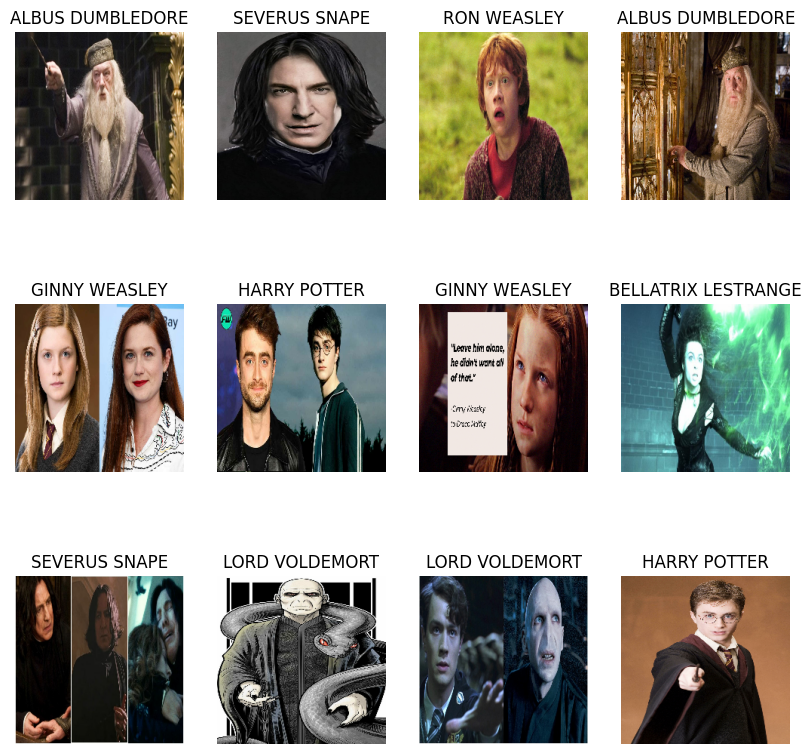

In [ ]:
plt.figure(figsize=(10, 10))
import matplotlib.pyplot as plt

# Assuming you have a list of class names defined as class_names

for image, label in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i+1)
        plt.imshow(image[i].numpy().astype("uint8"))
        plt.title(class_names[label[i]])
        plt.axis("off")

plt.show()

In [ ]:
def get_dataset_partitions_tf(dataset, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1

    ds_size = len(dataset)

    if shuffle:
        dataset = dataset.shuffle(shuffle_size, seed=12)

    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    train_ds = dataset.take(train_size)
    val_ds = dataset.skip(train_size).take(val_size)

    test_ds = dataset.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds

In [ ]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [ ]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255), # It divides each pixel to a normalized range between 0 and 1.
])

## Data Augmentation

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

def augment_data(image, label):
    # Randomly flip the image horizontally and vertically
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)

    image = tf.image.rot90(image, tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))

    # image = tf.image.random_zoom(image, (0.8, 1.2))

    image = tf.image.random_brightness(image, max_delta=0.2)

    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)

    image = tf.clip_by_value(image, 0.0, 1.0)

    return image, label


train_ds = train_ds.map(augment_data, num_parallel_calls=tf.data.experimental.AUTOTUNE)
val_ds = val_ds.map(augment_data, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test_ds = test_ds.map(augment_data, num_parallel_calls=tf.data.experimental.AUTOTUNE)


In [ ]:
images_list = []
labels_list = []

# Iterate through the dataset
for images, labels in train_ds:
    # Append the batch of images and labels to the lists
    images_list.append(images)
    labels_list.append(labels)

# Concatenate the lists to obtain the complete dataset
all_images = tf.concat(images_list, axis=0)
all_labels = tf.concat(labels_list, axis=0)


In [ ]:
print("Images shape:", all_images.shape)
print("Labels shape:", all_labels.shape)

Images shape: (864, 224, 224, 3)
Labels shape: (864,)


In [ ]:
input_shape = (224, 224, 3)
model = models.Sequential()

# Convolutional layers
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Flatten layer to transition from convolutional to dense layers
model.add(layers.Flatten())

# Dense layers
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))  # Optional dropout for regularization

# Output layer with softmax activation for classification
model.add(layers.Dense(18, activation='softmax'))

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  # Use 'categorical_crossentropy' for one-hot encoded labels
              metrics=['accuracy'])

# Display the model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)      

In [ ]:
model.fit(train_ds, epochs = 20, verbose = 1, shuffle = True)

Epoch 1/20
27/27 [==============================] - 22s 65ms/step - loss: 3.1319 - accuracy: 0.0787
Epoch 2/20
27/27 [==============================] - 17s 104ms/step - loss: 2.8780 - accuracy: 0.1074
Epoch 3/20
27/27 [==============================] - 18s 81ms/step - loss: 2.8669 - accuracy: 0.1051
Epoch 4/20
27/27 [==============================] - 19s 67ms/step - loss: 2.8974 - accuracy: 0.1039
Epoch 5/20
27/27 [==============================] - 16s 70ms/step - loss: 2.8595 - accuracy: 0.1145
Epoch 6/20
27/27 [==============================] - 16s 71ms/step - loss: 2.8531 - accuracy: 0.1122
Epoch 7/20
27/27 [==============================] - 16s 76ms/step - loss: 2.8677 - accuracy: 0.1088
Epoch 8/20
27/27 [==============================] - 16s 93ms/step - loss: 2.8458 - accuracy: 0.1063
Epoch 9/20
27/27 [==============================] - 15s 76ms/step - loss: 2.8338 - accuracy: 0.1133
Epoch 10/20
27/27 [==============================] - 16s 74ms/step - loss: 2.8388 - accuracy: 0.116

In [ ]:

history = model.fit(train_ds,epochs=10,validation_data=val_ds)

Epoch 1/10
27/27 [==============================] - 37s 871ms/step - loss: 2.7212 - accuracy: 0.1570 - val_loss: 2.7925 - val_accuracy: 0.1250
Epoch 2/10
27/27 [==============================] - 37s 865ms/step - loss: 2.7992 - accuracy: 0.1334 - val_loss: 2.6579 - val_accuracy: 0.1771
Epoch 3/10
27/27 [==============================] - 42s 867ms/step - loss: 2.7895 - accuracy: 0.1169 - val_loss: 2.8404 - val_accuracy: 0.1354
Epoch 4/10
27/27 [==============================] - 39s 885ms/step - loss: 2.7602 - accuracy: 0.1228 - val_loss: 2.8272 - val_accuracy: 0.0833
Epoch 5/10
27/27 [==============================] - 30s 612ms/step - loss: 2.7619 - accuracy: 0.1470 - val_loss: 2.8053 - val_accuracy: 0.1250
Epoch 6/10
27/27 [==============================] - 33s 639ms/step - loss: 2.8047 - accuracy: 0.1346 - val_loss: 2.7289 - val_accuracy: 0.1667
Epoch 7/10
27/27 [==============================] - 36s 893ms/step - loss: 2.7240 - accuracy: 0.1499 - val_loss: 2.7545 - val_accuracy: 0.1250

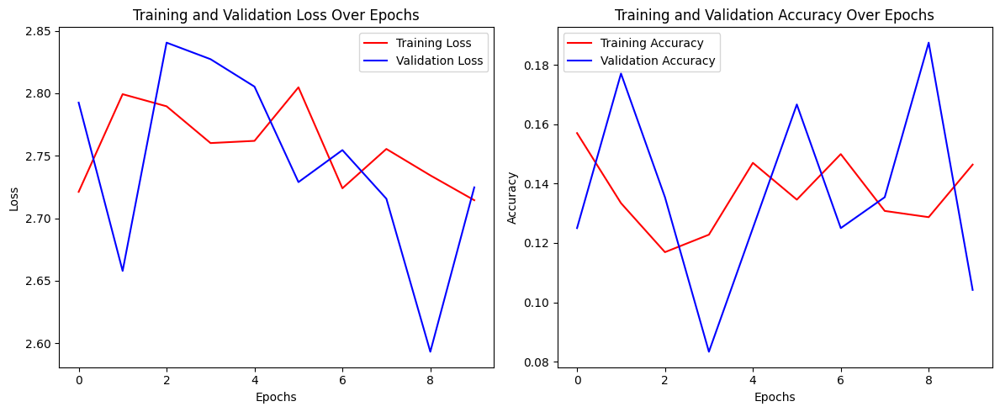

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

axes[0].plot(history.history['loss'], label='Training Loss', color='red')
axes[0].plot(history.history['val_loss'], label='Validation Loss', color='blue')
axes[0].set_title('Training and Validation Loss Over Epochs')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].legend()

axes[1].plot(history.history['accuracy'], label='Training Accuracy', color='red')
axes[1].plot(history.history['val_accuracy'], label='Validation Accuracy', color='blue')
axes[1].set_title('Training and Validation Accuracy Over Epochs')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Accuracy')
axes[1].legend()

plt.tight_layout()

plt.show()




In [ ]:
model.evaluate(test_ds)

4/4 [==============================] - 17s 45ms/step - loss: 2.7759 - accuracy: 0.1328


[2.775895595550537, 0.1328125]

Reasons for low accuracy and high loss:


1.   Distribution of classes in the dataset is uneven
2.   Dataset is too small or not representative of the real-world scenario
3.   Complexity of data



###Let me use the same datset in YOLONAS Architecture for image detection

## **2. Image Detection**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="vSLqNlAbwI46rXUil85o")
project = rf.workspace("leanse-sangeerth-6o0b2").project("harry-potter-character-detection")
dataset = project.version(1).download("yolov8")


In [ ]:
!pip install super-gradients

In [ ]:
from super_gradients.training import Trainer
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train,
    coco_detection_yolo_format_val
)
from super_gradients.training import models
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import (
    DetectionMetrics_050,
    DetectionMetrics_050_095
)
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback
from tqdm.auto import tqdm

import os
import requests
import cv2
import matplotlib.pyplot as plt
import glob
import numpy as np
import random

In [ ]:
ROOT_DIR = '/content/Harry-potter-character-detection-1'
train_imgs_dir = 'train/images'
train_labels_dir = 'train/labels'
val_imgs_dir = 'valid/images'
val_labels_dir = 'valid/labels'
test_imgs_dir = 'test/images'
test_labels_dir = 'test/labels'
classes = ['- ALBUS-DUMBLEDORE','DRACO-MALFOY','GINNY-WEASLEY','HARRY-POTTER','HERMIONE-GRANGER',
'LORD-VOLDEMORT',
'LUNA-LOVEGOOD',
'MINERVA-MCGONAGALL',
'MOLLY-WEASLEY',
'RON-WEASLEY',
'RUBEUS-HAGRID',
'SEVERUS-SNAPE',
'SIRIUS-BLACK']

In [ ]:
dataset_params = {
    'data_dir':ROOT_DIR,
    'train_images_dir':train_imgs_dir,
    'train_labels_dir':train_labels_dir,
    'val_images_dir':val_imgs_dir,
    'val_labels_dir':val_labels_dir,
    'test_images_dir':test_imgs_dir,
    'test_labels_dir':test_labels_dir,
    'classes':classes
}

In [ ]:
from IPython.display import clear_output

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

clear_output()

Indexing dataset annotations: 100%|██████████| 54/54 [00:00<00:00, 4047.11it/s]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

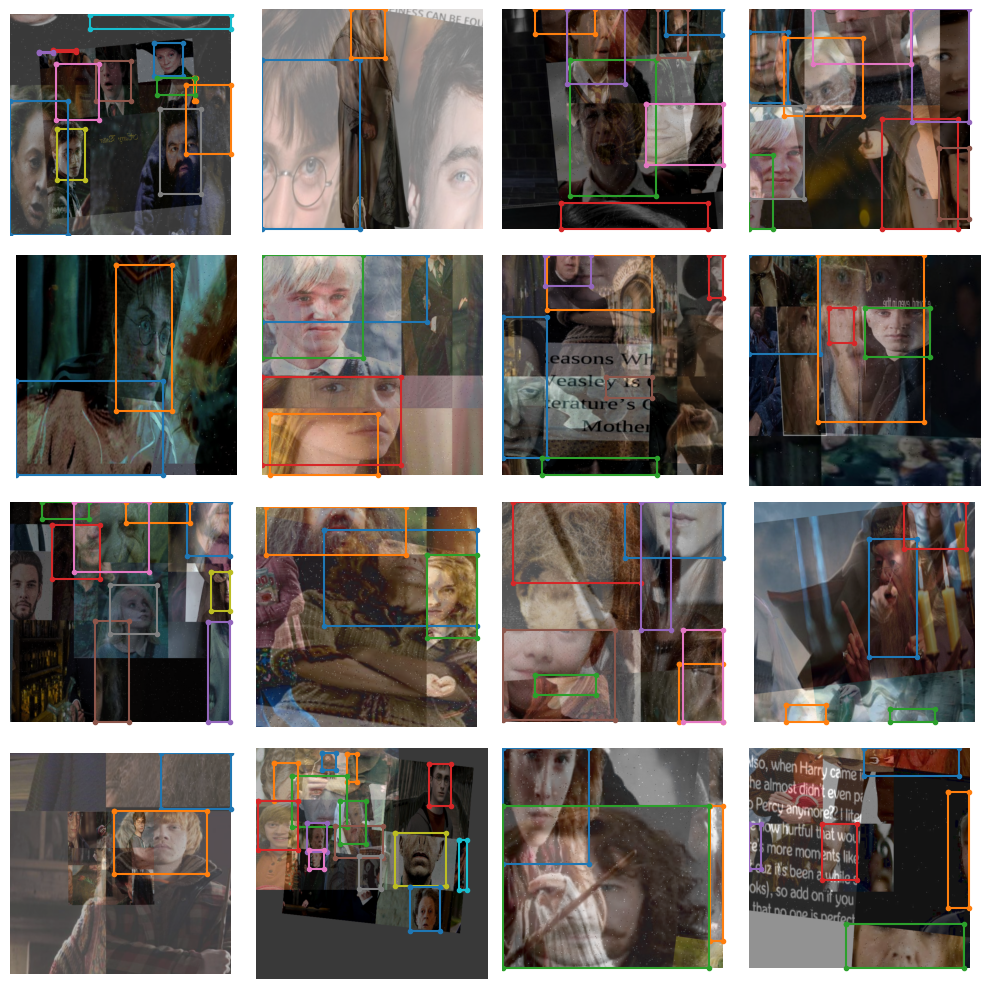

In [ ]:
train_data.dataset.plot()

In [ ]:
EPOCHS = 10
BATCH_SIZE = 16
WORKERS = 2

In [ ]:
train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        ),
        DetectionMetrics_050_095(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50:0.95'
}

In [ ]:
models_to_train = [
    'yolo_nas_s',
    'yolo_nas_m',
    'yolo_nas_l'
]

In [ ]:
CHECKPOINT_DIR = 'checkpoints'

In [ ]:
for model_to_train in models_to_train:
    trainer = Trainer(
        experiment_name=model_to_train,
        ckpt_root_dir=CHECKPOINT_DIR
    )

    model = models.get(
        model_to_train,
        num_classes=len(dataset_params['classes']),
        pretrained_weights="coco"
    )

    trainer.train(
        model=model,
        training_params=train_params,
        train_loader=train_data,
        valid_loader=val_data
    )

In [ ]:
best_model = models.get('yolo_nas_m',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path="/content/checkpoints/yolo_nas_m/RUN_20231129_170852_309821/ckpt_best.pth")
                        #checkpoint_path="checkpoints/my_first_yolonas_run/average_model.pth")

[2023-11-29 17:40:43] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/yolo_nas_m/RUN_20231129_170852_309821/ckpt_best.pth EMA checkpoint.


In [ ]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1,
                                                   top_k_predictions=300,
                                                   num_cls=len(dataset_params['classes']),
                                                   normalize_targets=True,
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01,
                                                                                                          nms_top_k=1000,
                                                                                                          max_predictions=300,
                                                                                                          nms_threshold=0.7)
                                                  ))

Testing:  75%|███████▌  | 3/4 [00:03<00:00,  1.05it/s]

{'PPYoloELoss/loss_cls': 2.4572978,
 'PPYoloELoss/loss_iou': 0.56963205,
 'PPYoloELoss/loss_dfl': 0.8406133,
 'PPYoloELoss/loss': 3.8675432,
 'Precision@0.50': 0.0,
 'Recall@0.50': 0.0,
 'mAP@0.50': 7.273847586475313e-05,
 'F1@0.50': 0.0}

Testing: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


### Since the test dataset is too small to give us a better precision. Let me try prediction on real images

[2023-11-29 17:47:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


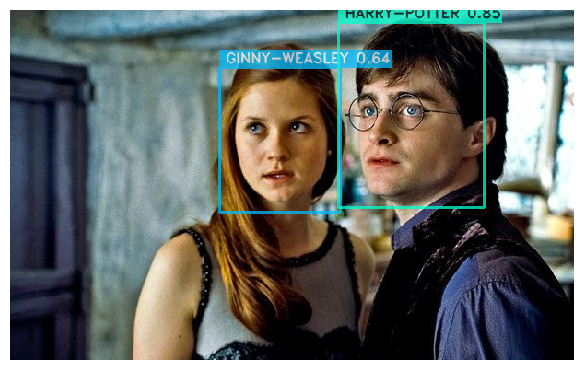

In [ ]:
test_image = '/content/harry-potter-ginny-harry_612x380_1-bd840398765b48a7934beb0cba78cbf1.jpg'
best_model.predict(test_image).show()

### Bingo!!!!!

### *   **Now let me try the best model on my favorite wizard battle**



In [ ]:
input_video_path = "/content/Dumbledore vs Lord Voldemort.mp4"
output_video_path = "output.mp4"
device=0

best_model.to(device).predict(input_video_path).save(output_video_path)

Processing Video: 100%|█████████▉| 1152/1155 [00:28<00:00, 51.61it/s]

In [ ]:
import cv2
import numpy as np
from IPython.display import HTML
from base64 import b64encode

# Function to encode a video to base64
def video_to_base64(video_path):
    video_file = open(video_path, "rb").read()
    video_encoded = b64encode(video_file).decode('ascii')
    return video_encoded

# Function to display an HTML video tag
def display_video_html(video_path):
    video_encoded = video_to_base64(video_path)
    video_tag = f"<video controls src='data:video/mp4;base64,{video_encoded}' type='video/mp4'>"
    return HTML(data=video_tag)

# Specify your input and output paths
input_video_path = "/content/Dumbledore vs Voldemort 🤩 .mp4"
output_video_path = "finaloutput.mp4"
device = 0

# Assuming best_model is an instance of your model class
# Make sure to replace this line with the actual method you use for prediction
# The save method is assumed to save the processed video
best_model.to(device).predict(input_video_path).save(output_video_path)

# # Display the input video
# print("Input Video:")
# display_video_html(input_video_path)

# Display the output video
print("Output Video:")
display_video_html(output_video_path)


Processing Video: 100%|██████████| 751/751 [00:21<00:00, 34.17it/s]


Output Video:


## **yess!!!! The dataset is doing tremendous job which shows the importance of annotation in computer vision problems**

# **3. Face Recognition using MTCNN library**

In [4]:
!pip install mtcnn

## Extracting only faces from images dataset and storing it seperately

In [ ]:
import os
import cv2
from mtcnn.mtcnn import MTCNN

def extract_faces(input_folder, output_folder):
    # Create output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Create an MTCNN detector
    detector = MTCNN()

    # Loop through each image in the input folder
    for filename in os.listdir(input_folder):
        input_path = os.path.join(input_folder, filename)

        try:
            # Read the image
            image = cv2.imread(input_path)

            # Detect faces using MTCNN
            faces = detector.detect_faces(image)

            # Save each detected face
            for i, face in enumerate(faces):
                x, y, w, h = face['box']
                extracted_face = image[y:y+h, x:x+w]

                output_filename = f"{filename.split('.')[0]}_face_{i + 1}.jpg"
                output_path = os.path.join(output_folder, output_filename)
                cv2.imwrite(output_path, extracted_face)
        except Exception as e:
            print(f"Error processing {input_path}: {str(e)}")

# Specify input and output folders
input_root_folder = "/content/gdrive/MyDrive/Datasets/Harry Potter"
output_root_folder = "/content/gdrive/MyDrive/Datasets/Harry Potter faces"

# Loop through each folder in the root folder
for folder_name in os.listdir(input_root_folder):
    input_folder = os.path.join(input_root_folder, folder_name)
    output_folder = os.path.join(output_root_folder, folder_name)

    # Extract faces from images in the current folder
    extract_faces(input_folder, output_folder)


Using teachable machine website to build best machine learning model

https://teachablemachine.withgoogle.com/

# Running on one of our images dataset

1/1 [==============================] - 1s 864ms/step
Class: Bellatrix Lestrange
Confidence Score: 0.89276516


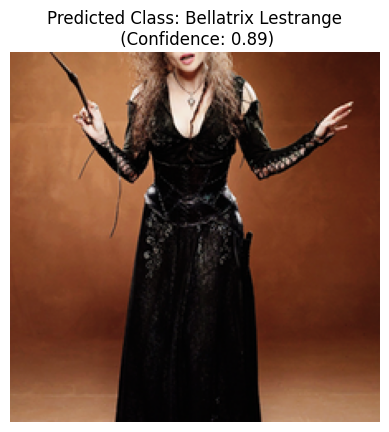

In [7]:
from keras.models import load_model  # TensorFlow is required for Keras to work
from PIL import Image, ImageOps  # Install pillow instead of PIL
import numpy as np
import matplotlib.pyplot as plt

# Disable scientific notation for clarity
np.set_printoptions(suppress=True)

# Load the model
model = load_model("/content/gdrive/MyDrive/Datasets/converted_keras/keras_model.h5", compile=False)

# Load the labels
class_names = open("/content/gdrive/MyDrive/Datasets/converted_keras/labels.txt", "r").readlines()

# Create the array of the right shape to feed into the keras model
# The 'length' or number of images you can put into the array is
# determined by the first position in the shape tuple, in this case 1
data = np.ndarray(shape=(1, 224, 224, 3), dtype=np.float32)

# Replace this with the path to your image
image = Image.open("/content/gdrive/MyDrive/Datasets/Harry Potter/BELLATRIX LESTRANGE/02767db8eef8a64b994d2cbb9708b29f.png").convert("RGB")

# resizing the image to be at least 224x224 and then cropping from the center
size = (224, 224)
image = ImageOps.fit(image, size, Image.Resampling.LANCZOS)

# turn the image into a numpy array
image_array = np.asarray(image)

# Normalize the image
normalized_image_array = (image_array.astype(np.float32) / 127.5) - 1

# Load the image into the array
data[0] = normalized_image_array

# Predicts the model
prediction = model.predict(data)
index = np.argmax(prediction)
class_name = class_names[index]
confidence_score = prediction[0][index]

# Print prediction and confidence score
print("Class:", class_name[2:], end="")
print("Confidence Score:", confidence_score)

plt.imshow(image)
plt.title(f"Predicted Class: {class_name[2:]} (Confidence: {confidence_score:.2f})")
plt.axis("off")
plt.show()


Well!! it is working good. Now let us try on some videos in pycharm for easy navigation
